<a href="https://colab.research.google.com/github/FlaviaLopes/dio-challenges-coding-the-future-with-baires-dev/blob/main/projeto_5/Criando_um_sistema_de_reconhecimento_facial_do_zero.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

vídeo de teste: https://youtu.be/AyBRWtIfsLw?si=W720OB27QS7rLDK6&t=130
- Arya, John e Sansa

O objetivo é simples: detectar as faces da Arya, Sansa e Jonh em cenas de Game of Thrones. Para alcançar esse objetivo, eu utilizo a rede YOLO v8 nano para treinar um modelo de detecção e classificação facial específico.

Steps:
- preparar o dataset
  - são três classes: Arya Stark, Sansa Stark e John Snow
  - cerca de 50-70 imagens de cada classe são coletadas e rotuladas com o software Roboflow.
  - link do meu dataset é público em: https://universe.roboflow.com/brothers-onqjy/yolo-face-detector-got/dataset/8

- codding
  - duas classes são escritas:
    - i) DatasetManager, que lê e processa os metadados, divide as imagens em conjuntos equilibrados de treino, teste e validação, e as organiza em diretórios;
    - ii) YOLOFaceDetector, que organiza todo o pipeline de treino, validação e teste do modelo.

- trying the model
  - um trecho de vídeo com imagens não utilizadas no treino é submetido ao modelo para avaliação.

## Imports

In [1]:
from google.colab import drive
import yaml

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!!pip install ultralytics
!pip install albumentations
!pip install scikit-multilearn
!pip install mtcnn
!pip install lz4 joblib

from skmultilearn.model_selection import iterative_train_test_split
from IPython.display import Image, display, clear_output
from ultralytics import YOLO
from mtcnn import MTCNN
import tensorflow as tf
import torch
import cv2
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
clear_output()

## Helpers

__Orientação a objeto__

- É muito útil organizar o código em classes, fica mais fácil de atualizar, depurar, e encapsula a complexidade do pipeline.

- Parece muito 300 linhas de código, mas ao fim elas me poupam muito tempo, pois durante o desenvolvimento do projeto muitas etapas precisarão ser refeitas. O carregamento e processamento das imagens, sem dúvida é o processo mais crítico.

- E muitas das funcionalidades a seguir, são reaproveitadas de outros projetos ⌛

- Enfim, código organizado é essencial para extensão e depuração, e a orientação a objeto ajuda nisso.

In [3]:
global ignore_files
ignore_files = ['.ipynb_checkpoints']
from google.colab import drive
import yaml

class DatasetManager():
  def __init__(self, dataset_dir_path, augment_train=True):
    self.dataset_dir_path = dataset_dir_path
    self.dataframe = None
    self.yaml_data = None
    self.augment_train = augment_train
    self.load_yaml(os.path.join(self.dataset_dir_path, 'data.yaml'))

  def load_yaml(self, yaml_path):
    with open(yaml_path, 'r') as f:
      self.yaml_data = yaml.safe_load(f)
    if self.augment_train:
      self.update_yaml(yaml_path)

  def update_yaml(self, yaml_path):
    update = {
      "imgsz": 640,
      "augment": {
        "albumentations": [
          {"RandomCrop": {"width": 0.8, "height": 0.8, "p": 1.0}},
          {"HorizontalFlip": {"p": 0.5}},
          {"RandomBrightnessContrast": {"brightness_limit": [0.1, 0.3], "contrast_limit": [0.1, 0.3], "p": 0.5}}, # Changed tuple to list
          {"ShiftScaleRotate": {"shift_limit": 0.0625, "scale_limit": 0.2, "rotate_limit": 15, "p": 0.5}},
          {"GaussNoise": {"var_limit": [10.0, 50.0], "p": 0.2}}, # Changed tuple to list
          {"HueSaturationValue": {"hue_shift_limit": 10, "sat_shift_limit": 15, "val_shift_limit": 10, "p": 0.3}},
          {"Normalize": {"mean": [0.485, 0.456, 0.406], "std": [0.229, 0.224, 0.225], "p": 1.0}}, # Changed tuple to list
        ]
      }
    }
    self.yaml_data.update(update)
    with open(yaml_path, "w") as file:
      yaml.dump(self.yaml_data, file, default_flow_style=False)

  def load_metadata(self):
    splits = [os.path.join(self.dataset_dir_path, it) for it in os.listdir(self.dataset_dir_path) if it not in ignore_files]
    splits = [it for it in splits if os.path.isdir(it)]
    columns = ['label_path', 'image_path', 'category', 'x', 'y', 'width', 'height']
    dataframe = pd.DataFrame()
    for split in splits:
      files = [os.path.join(split, 'labels', it) for it in os.listdir(os.path.join(split, 'labels')) if it.endswith('.txt')]
      images = [os.path.join(split, 'images', it) for it in os.listdir(os.path.join(split, 'images'))]
      values = []
      index = []
      for i, file in enumerate(files):
        try:
          with open(file, 'r') as f:
            lines = f.readlines()
            if lines:
              for line in lines:
                values.append([file] + [images[i]] + [float(it) for it in line.split()])
                index.append(file.split('/')[-1])
            else:
              values.append([file] + [images[i]] + [np.nan, np.nan, np.nan, np.nan, np.nan])
              index.append(file.split('/')[-1])
        except Exception as e:
            print(f"Error reading file '{file}': {e}")
      temp = pd.DataFrame(data=values, index=index, columns=columns)
      temp['split'] = split.split('/')[-1]
      dataframe = pd.concat([dataframe, temp], axis=0)
    dataframe['label'] = dataframe['category'].map(dict(enumerate(self.yaml_data['names'])))
    self.dataframe = dataframe

  def reset_file_names(self):
    splits = [os.path.join(self.dataset_dir_path, it) for it in self.dataframe.new_split.unique()]
    splits = [it for it in splits if os.path.isdir(it)]

    map_ = dict([(v, f'{k}.txt') for k, v in dict(enumerate(self.dataframe.index)).items()])
    self.dataframe.index = self.dataframe.index.map(map_)

    images = self.dataframe.image_path.values
    map_images = dict([(v, os.path.join('/'.join(v.split('/')[:-1]), f"{str(k)}.{v.split('.')[-1]}")) for k, v in dict(enumerate(images)).items()])
    self.dataframe.image_path = self.dataframe.image_path.map(map_images)

    labels = self.dataframe.label_path.values
    map_labels = dict([(v, os.path.join('/'.join(v.split('/')[:-1]), f"{str(k)}.txt")) for k, v in dict(enumerate(labels)).items()])
    self.dataframe.label_path = self.dataframe.label_path.map(map_labels)

    for k, v in map_images.items():
      os.rename(k, v)

    for k, v in map_labels.items():
      os.rename(k, v)

    return self

  def remove_not_annotated(self):
    idx = list(set(self.dataframe.index[self.dataframe.isnull().sum(axis=1) > 0]))
    for it in idx:
      image_path = np.unique(self.dataframe.loc[idx, 'image_path'])
      label_path = np.unique(self.dataframe.loc[idx, 'label_path'])
      if os.path.exists(image_path[0]):
        os.remove(image_path[0])
      else:
        print(f"Warning: File not found - {image_path[0]}")

      if os.path.exists(image_path[0]):
        os.remove(label_path[0])
      else:
        print(f"Warning: File not found - {label_path[0]}")
    self.dataframe = self.dataframe.dropna()
    print(f'Os seguintes arquivos foram excluídos porque não possuiam anotações: {idx}')
    return self

  def multilabel_stratified_split(self, test_size=0.3):
    """
    """
    if self.dataframe is None:
      raise ValueError("DataFrame não carregado. Chame o método 'load' antes.")

    d = {}
    for it in np.unique(self.dataframe.index):
      labels = self.dataframe.loc[it, 'category']
      if type(labels) == pd.core.series.Series:
        labels = labels.astype(int).values
      else:
        labels = [int(labels)]
      d.update({it: [1 if label in labels else 0 for label in [0, 1, 2, 3]]})

    X = np.array(list(d.keys())).reshape(-1, 1)
    y = np.array(list(d.values()))
    X_train, y_train, X_test, y_test = iterative_train_test_split(X, y, test_size=test_size)
    X_test, y_test, X_val, y_val = iterative_train_test_split(X_test, y_test, test_size=0.5)

    if 'new_split' in self.dataframe.columns:
      self.dataframe['split'] = self.dataframe['new_split'].copy()

    self.dataframe.loc[X_train.flatten(), 'new_split'] = 'train'
    self.dataframe.loc[X_test.flatten(), 'new_split'] = 'test'
    self.dataframe.loc[X_val.flatten(), 'new_split'] = 'valid'

  def organize_images_directories(self, move=False):
    if self.dataframe is None:
      raise ValueError("DataFrame não carregado. Chame o método 'load' antes.")

    valid_dir = os.path.join(self.dataset_dir_path, 'valid')
    test_dir = os.path.join(self.dataset_dir_path, 'test')
    train_dir = os.path.join(self.dataset_dir_path, 'train')

    if not os.path.exists(valid_dir):
      os.makedirs(valid_dir)
    if not os.path.exists(os.path.join(valid_dir, 'images')):
      os.makedirs(os.path.join(valid_dir, 'images'))
    if not os.path.exists(os.path.join(valid_dir, 'labels')):
      os.makedirs(os.path.join(valid_dir, 'labels'))

    if not os.path.exists(test_dir):
      os.makedirs(test_dir)
    if not os.path.exists(os.path.join(test_dir, 'images')):
      os.makedirs(os.path.join(test_dir, 'images'))
    if not os.path.exists(os.path.join(test_dir, 'labels')):
      os.makedirs(os.path.join(test_dir, 'labels'))

    if not os.path.exists(train_dir):
      os.makedirs(train_dir)
    if not os.path.exists(os.path.join(train_dir, 'images')):
      os.makedirs(os.path.join(train_dir, 'images'))
    if not os.path.exists(os.path.join(train_dir, 'labels')):
      os.makedirs(os.path.join(train_dir, 'labels'))

    for idx, row in self.dataframe.loc[~self.dataframe.index.duplicated(), :].iterrows():
      if row['split'] != row['new_split']:
        if move:
          shutil.move(row['image_path'], row['image_path'].replace(row['split'], row['new_split']))
          shutil.move(row['label_path'], row['label_path'].replace(row['split'], row['new_split']))
        else:
          shutil.copy2(row['image_path'], row['image_path'].replace(row['split'], row['new_split']))
          shutil.copy2(row['label_path'], row['label_path'].replace(row['split'], row['new_split']))
        self.dataframe.loc[idx, 'image_path'] = row['image_path'].replace(row['split'], row['new_split'])
        self.dataframe.loc[idx, 'label_path'] = row['label_path'].replace(row['split'], row['new_split'])

class YOLOFaceRecognizer():
  def __init__(self, data_yaml_path):
    self.model = YOLO('yolov8n.pt')
    self.data_yaml = data_yaml_path

  def fit_model(self, epochs=50, batch=32, imgsz=640, optimizer='Adam', lr0=0.001, patience=5, freeze=[0, 1, 2, 3]):
    """
    Treina um modelo YOLOv5/YOLOv8 para reconhecimento facial.
    :param data_yaml: Caminho para o arquivo de configuração do dataset YOLO.
    :param model_size: Tamanho do modelo YOLO ('yolov5s', 'yolov5m', etc.).
    :param epochs: Número de épocas para treinamento.
    """

    train_history = self.model.train(
        data=self.data_yaml,
        epochs=epochs,
        batch=batch,
        imgsz=imgsz,
        device='cuda' if torch.cuda.is_available() else 'cpu',
        optimizer=optimizer,
        lr0=lr0,
        patience=patience,
        freeze=freeze
    )
    return train_history

  def fine_tune(self, epochs=50, batch=32, imgsz=640, optimizer='Adam', lr0=0.001, patience=5, freeze=[]):
    fine_tune_history = self.model.train(
        data=yaml_path,
        epochs=epochs,
        batch=batch,
        imgsz=imgsz,
        device='cuda' if torch.cuda.is_available() else 'cpu',
        optimizer=optimizer,
        lr0=lr0,
        patience=patience,
        freeze=freeze
    )
    return fine_tune_history

  def evaluate(self):
    val_metrics = self.model.val(data=self.data_yaml, split='val')
    test_metrics = self.model.val(data=self.data_yaml, task='test', split='test')
    return val_metrics, test_metrics

## Settings

In [4]:
base_dir = 'base_dir'
dataset_path = os.path.join(base_dir, 'datasets/GoT')
yaml_path = os.path.join(dataset_path, 'data.yaml')
roboflow_url = "https://app.roboflow.com/ds/w3htpWBmze?key=MY_KEY"
VAR = {
    'IMG_SIZE': 640,
    'BATCH_SIZE': 16,
    'EPOCHS': 50,
    'FINE_TUNE_EPOCHS': 50,
    'SEED': 42,
    'LEARNING_RATE': 0.001,
    'LEARNING_RATE_FINE_TUNE': 1e-5,
    'PATIENCE': 5
}

In [ ]:
# %rm -rf '/content/drive/MyDrive/DIO Baires Dev/datasets/GoT/raw'
# %rm -rf '/content/drive/MyDrive/DIO Baires Dev/datasets/GoT/train'
# %rm -rf '/content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test'
# %rm -rf '/content/drive/MyDrive/DIO Baires Dev/datasets/GoT/valid'
# %rm '/content/drive/MyDrive/DIO Baires Dev/datasets/GoT/data.yaml'
# %rm -rf '/content/drive/MyDrive/DIO Baires Dev/datasets/GoT/cropped'
# %rm -rf '/content/drive/MyDrive/DIO Baires Dev/datasets/GoT/raw'
# %rm -rf '/content/drive/MyDrive/DIO Baires Dev/datasets/GoT/runs'

In [ ]:
torch.cuda.is_available()

False

## Data Load

- Aqui eu faço o download da base preparada no Roboflow e adiciono as imagens ao drive.
  - download the dataset
  - extract metadata
  - remove images with no annotations
  - apply multilabel stratified split
  - organize images in directories based on new split
  - reset file names

In [ ]:
import shutil
os.chdir(dataset_path)
os.chdir('..')
shutil.rmtree(dataset_path)
os.makedirs(dataset_path)
os.chdir(dataset_path)
!curl -L $roboflow_url > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
os.rename('./train', 'raw')
clear_output()

In [ ]:
dm = DatasetManager(dataset_path, augment_train=True)
dm.load_metadata()

Veja que há imagens com mais de uma classe, assim como na classificação multilabel. Neste caso, vou usar o método construído no projeto_1 para divisão estratificada multilabel utilizando o `skmultilearn`.

In [ ]:
print(dm.dataframe.shape)
dm.dataframe.iloc[:5, 2:]

(401, 9)


,category,x,y,width,height,split,label
100_png.rf.d065d9766eee34f44e6de98af420af04.txt,0.0,0.425000,0.286920,0.323437,0.502110,raw,Arya Stark
100_png.rf.d065d9766eee34f44e6de98af420af04.txt,3.0,0.714063,0.597046,0.232813,0.276371,raw,others
101_png.rf.a686b50c00521c06c510bd94e182d537.txt,0.0,0.632812,0.216036,0.181250,0.367483,raw,Arya Stark
102_png.rf.4cc6c76a5a63f7e0a72b156e8257e556.txt,0.0,0.284375,0.416481,0.146875,0.278396,raw,Arya Stark
103_png.rf.ce4788d3947339313cdd347dc0b6792f.txt,0.0,0.234375,0.652561,0.228125,0.412027,raw,Arya Stark


In [ ]:
dm = dm.remove_not_annotated()

Os seguintes arquivos foram excluídos porque não possuiam anotações: ['22_jpeg.rf.b8071bc8a2279cbfdebd8c7d84b9cfc9.txt']


In [ ]:
dm.multilabel_stratified_split(test_size=0.3)

In [ ]:
dm.dataframe.iloc[:5, 2:]

,category,x,y,width,height,split,label,new_split
100_png.rf.d065d9766eee34f44e6de98af420af04.txt,0.0,0.425000,0.286920,0.323437,0.502110,raw,Arya Stark,train
100_png.rf.d065d9766eee34f44e6de98af420af04.txt,3.0,0.714063,0.597046,0.232813,0.276371,raw,others,train
101_png.rf.a686b50c00521c06c510bd94e182d537.txt,0.0,0.632812,0.216036,0.181250,0.367483,raw,Arya Stark,valid
102_png.rf.4cc6c76a5a63f7e0a72b156e8257e556.txt,0.0,0.284375,0.416481,0.146875,0.278396,raw,Arya Stark,train
103_png.rf.ce4788d3947339313cdd347dc0b6792f.txt,0.0,0.234375,0.652561,0.228125,0.412027,raw,Arya Stark,valid


Aqui, as imagens de raw serão distribuídas em diretórios train, test e valid, conforme a estratificação anterior.

In [ ]:
# na primeira vez, move=False para preservar os dados em raw.
dm.organize_images_directories(move=False)

Aqui, as imagens tem seus nomes renovados, para melhor identificação.



In [ ]:
dm = dm.reset_file_names()

In [ ]:
dm.dataframe.iloc[:5, 2:]

,category,x,y,width,height,split,label,new_split
1.txt,0.0,0.425000,0.286920,0.323437,0.502110,raw,Arya Stark,train
1.txt,3.0,0.714063,0.597046,0.232813,0.276371,raw,others,train
2.txt,0.0,0.632812,0.216036,0.181250,0.367483,raw,Arya Stark,valid
3.txt,0.0,0.284375,0.416481,0.146875,0.278396,raw,Arya Stark,train
4.txt,0.0,0.234375,0.652561,0.228125,0.412027,raw,Arya Stark,valid


Podemos ver que John Snow é o personagem com menos exemplos, seguido de Arya e Sansa. Por isso, farei uso de data augmentation usando a biblioteca `albmentations`. O pipeline de aumentação está em data.yaml.

Entretanto, observe que mesmo com data augmentation essa quantidade de amostras é muito pequena para o propósito. Para que o modelo performe melhor seria necessário mais exemplos de cada classe, de preferência em diferentes ângulos faciais, e condições variadas.

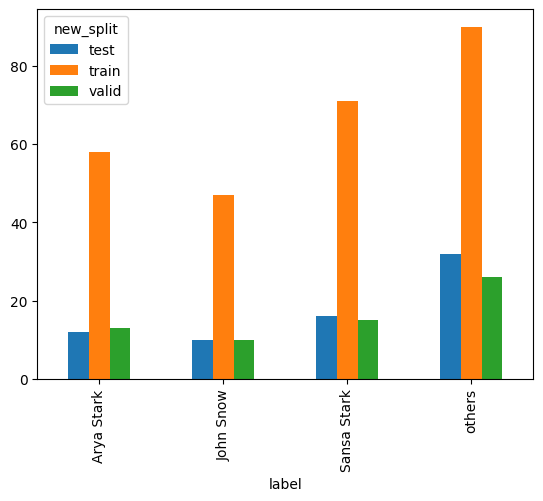

In [ ]:
dm.dataframe.groupby(['label', 'new_split']).size().unstack(fill_value=0).plot(kind='bar');

In [ ]:
dm.yaml_data['augment']

{'albumentations': [{'RandomCrop': {'width': 0.8, 'height': 0.8, 'p': 1.0}},
  {'HorizontalFlip': {'p': 0.5}},
  {'RandomBrightnessContrast': {'brightness_limit': (0.1, 0.3),
    'contrast_limit': (0.1, 0.3),
    'p': 0.5}},
  {'ShiftScaleRotate': {'shift_limit': 0.0625,
    'scale_limit': 0.2,
    'rotate_limit': 15,
    'p': 0.5}},
  {'GaussNoise': {'var_limit': (10.0, 50.0), 'p': 0.2}},
  {'HueSaturationValue': {'hue_shift_limit': 10,
    'sat_shift_limit': 15,
    'val_shift_limit': 10,
    'p': 0.3}},
  {'Normalize': {'mean': (0.485, 0.456, 0.406),
    'std': (0.229, 0.224, 0.225),
    'p': 1.0}}]}

## Modelling


In [ ]:
yolo = YOLOFaceRecognizer(yaml_path)

train_history = yolo.fit_model(
  epochs=VAR['EPOCHS'],
  batch=VAR['BATCH_SIZE'],
  imgsz=VAR['IMG_SIZE'],
  lr0=VAR['LEARNING_RATE'],
  patience=VAR['PATIENCE']
)
fine_tune_history = yolo.fine_tune(
  epochs=VAR['FINE_TUNE_EPOCHS'],
  batch=VAR['BATCH_SIZE'],
  imgsz=VAR['IMG_SIZE'],
  lr0=VAR['LEARNING_RATE_FINE_TUNE'],
  patience=VAR['PATIENCE']
)

Ultralytics 8.3.72 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/DIO Baires Dev/datasets/GoT/data.yaml, epochs=50, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=[0, 1, 2, 3], multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_la

100%|██████████| 755k/755k [00:00<00:00, 20.8MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/train/labels... 176 images, 0 backgrounds, 0 corrupt: 100%|██████████| 176/176 [00:06<00:00, 28.55it/s]


train: New cache created: /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/valid/labels... 41 images, 0 backgrounds, 0 corrupt: 100%|██████████| 41/41 [00:00<00:00, 56.36it/s]

val: New cache created: /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/valid/labels.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G       1.33      3.769      1.394         63        640: 100%|██████████| 11/11 [02:33<00:00, 13.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.68s/it]

                   all         41         64    0.00211      0.606     0.0641     0.0214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G      1.227      2.769      1.197         43        640: 100%|██████████| 11/11 [02:15<00:00, 12.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.06s/it]

                   all         41         64     0.0844      0.482      0.131     0.0648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G      1.138      2.352      1.138         52        640: 100%|██████████| 11/11 [02:19<00:00, 12.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.09s/it]

                   all         41         64     0.0725      0.756      0.229      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G      1.153      2.202      1.188         54        640: 100%|██████████| 11/11 [02:17<00:00, 12.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.04s/it]

                   all         41         64      0.075      0.801      0.269      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G      1.123      2.001      1.123         53        640: 100%|██████████| 11/11 [02:16<00:00, 12.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.98s/it]

                   all         41         64      0.617      0.117      0.295      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G       1.17      1.918      1.151         39        640: 100%|██████████| 11/11 [02:16<00:00, 12.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.40s/it]

                   all         41         64      0.252       0.44      0.305      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G      1.166      1.824      1.122         51        640: 100%|██████████| 11/11 [02:17<00:00, 12.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.82s/it]

                   all         41         64       0.22      0.325      0.314      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G      1.188      1.825      1.136         48        640: 100%|██████████| 11/11 [02:16<00:00, 12.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.66s/it]

                   all         41         64      0.357      0.399      0.349      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G      1.094      1.715       1.11         57        640: 100%|██████████| 11/11 [02:14<00:00, 12.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.85s/it]

                   all         41         64      0.396      0.382      0.369      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G      1.105      1.612      1.128         56        640: 100%|██████████| 11/11 [02:11<00:00, 11.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.50s/it]

                   all         41         64       0.23      0.372      0.289      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G      1.073      1.489      1.084         61        640: 100%|██████████| 11/11 [02:14<00:00, 12.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.84s/it]

                   all         41         64      0.342      0.477      0.372      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G      1.037      1.428      1.072         45        640: 100%|██████████| 11/11 [02:15<00:00, 12.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.80s/it]

                   all         41         64      0.391      0.431      0.406      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G      1.046       1.41       1.05         43        640: 100%|██████████| 11/11 [02:12<00:00, 12.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.53s/it]

                   all         41         64      0.445      0.428      0.456      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G      1.036      1.368      1.084         40        640: 100%|██████████| 11/11 [02:18<00:00, 12.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.01s/it]

                   all         41         64      0.497      0.583       0.52      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G     0.9681      1.343      1.053         50        640: 100%|██████████| 11/11 [02:13<00:00, 12.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.63s/it]

                   all         41         64      0.572      0.639      0.555      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G     0.9838      1.292      1.035         52        640: 100%|██████████| 11/11 [02:12<00:00, 12.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.46s/it]

                   all         41         64      0.625      0.512      0.551      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G     0.9411      1.267      1.024         50        640: 100%|██████████| 11/11 [02:10<00:00, 11.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.69s/it]

                   all         41         64       0.46      0.546      0.476      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         0G     0.9022      1.216      1.022         44        640: 100%|██████████| 11/11 [02:10<00:00, 11.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.65s/it]

                   all         41         64      0.333      0.465      0.426      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G     0.9362      1.161      1.021         51        640: 100%|██████████| 11/11 [02:11<00:00, 11.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.38s/it]

                   all         41         64      0.454      0.526      0.547      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         0G     0.8956      1.109      1.009         42        640: 100%|██████████| 11/11 [02:14<00:00, 12.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.96s/it]

                   all         41         64      0.424      0.544      0.501      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         0G     0.8802       1.05     0.9955         52        640: 100%|██████████| 11/11 [02:15<00:00, 12.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.36s/it]

                   all         41         64      0.572      0.568      0.574      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G     0.8453     0.9827     0.9813         45        640: 100%|██████████| 11/11 [02:11<00:00, 12.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.76s/it]

                   all         41         64      0.794      0.457        0.6      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G     0.8502      1.005     0.9867         64        640: 100%|██████████| 11/11 [02:14<00:00, 12.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.22s/it]

                   all         41         64      0.578      0.552      0.577      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G      0.866     0.9972     0.9939         54        640: 100%|██████████| 11/11 [02:17<00:00, 12.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.99s/it]

                   all         41         64      0.622      0.582      0.592       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G      0.842     0.9328     0.9929         48        640: 100%|██████████| 11/11 [02:11<00:00, 11.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.70s/it]

                   all         41         64       0.71       0.64      0.661      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      0.832     0.8669     0.9868         37        640: 100%|██████████| 11/11 [02:13<00:00, 12.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.65s/it]

                   all         41         64      0.557      0.618      0.606      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G     0.7986     0.9129     0.9688         55        640: 100%|██████████| 11/11 [02:13<00:00, 12.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.74s/it]

                   all         41         64      0.452      0.563      0.512      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         0G     0.8063     0.8776     0.9844         44        640: 100%|██████████| 11/11 [02:11<00:00, 11.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.51s/it]

                   all         41         64        0.7      0.536       0.58      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         0G     0.8105     0.7992     0.9605         57        640: 100%|██████████| 11/11 [02:13<00:00, 12.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.85s/it]

                   all         41         64      0.523      0.693      0.585      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         0G        0.8       0.84     0.9622         40        640: 100%|██████████| 11/11 [02:14<00:00, 12.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.71s/it]

                   all         41         64      0.566      0.702       0.62       0.46
EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 25, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



30 epochs completed in 1.226 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.72 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.77s/it]


                   all         41         64      0.709      0.642       0.66      0.468
            Arya Stark         13         13      0.467      0.923      0.744      0.546
             John Snow         10         10      0.938        0.5       0.63      0.446
           Sansa Stark         15         15       0.82        0.6      0.745      0.602
                others         12         26      0.612      0.547      0.523       0.28
Speed: 4.4ms preprocess, 213.2ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to runs/detect/train2
Ultralytics 8.3.72 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/DIO Baires Dev/datasets/GoT/data.yaml, epochs=50, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=0, project=None, name=train22, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic

train: Scanning /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/train/labels.cache... 176 images, 0 backgrounds, 0 corrupt: 100%|██████████| 176/176 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/valid/labels.cache... 41 images, 0 backgrounds, 0 corrupt: 100%|██████████| 41/41 [00:00<?, ?it/s]

Plotting labels to runs/detect/train22/labels.jpg... 


optimizer: Adam(lr=1e-05, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train22
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G     0.8786     0.9804       1.01         63        640: 100%|██████████| 11/11 [02:43<00:00, 14.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.53s/it]

                   all         41         64     0.0391      0.173     0.0895     0.0659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G     0.8764      1.008      1.007         43        640: 100%|██████████| 11/11 [02:33<00:00, 13.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.49s/it]

                   all         41         64      0.358      0.316      0.297      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G     0.8163     0.9697     0.9754         52        640: 100%|██████████| 11/11 [02:30<00:00, 13.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.88s/it]

                   all         41         64      0.377      0.457       0.41      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G     0.8228     0.9763      1.011         54        640: 100%|██████████| 11/11 [02:34<00:00, 14.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.41s/it]

                   all         41         64      0.456      0.561      0.531      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G     0.8402      0.907     0.9832         53        640: 100%|██████████| 11/11 [02:32<00:00, 13.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.96s/it]

                   all         41         64      0.618      0.499      0.599      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G     0.8298     0.9048       0.99         39        640: 100%|██████████| 11/11 [02:31<00:00, 13.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.40s/it]

                   all         41         64      0.654      0.519      0.613      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G     0.8119     0.8458     0.9738         51        640: 100%|██████████| 11/11 [02:33<00:00, 13.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.88s/it]

                   all         41         64      0.725       0.51      0.647      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G     0.7955     0.8153     0.9798         48        640: 100%|██████████| 11/11 [02:30<00:00, 13.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.62s/it]

                   all         41         64       0.78      0.534      0.672      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G     0.7915     0.8259     0.9756         57        640: 100%|██████████| 11/11 [02:32<00:00, 13.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.40s/it]

                   all         41         64      0.753       0.58      0.679      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G     0.7868     0.7974     0.9804         56        640: 100%|██████████| 11/11 [02:30<00:00, 13.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.47s/it]

                   all         41         64      0.777      0.573      0.683      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G     0.7871     0.8069     0.9644         61        640: 100%|██████████| 11/11 [02:27<00:00, 13.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.12s/it]

                   all         41         64      0.757       0.56      0.682      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G     0.7813     0.8047     0.9815         45        640: 100%|██████████| 11/11 [02:29<00:00, 13.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.46s/it]

                   all         41         64      0.786      0.549       0.68       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G     0.7711     0.7617     0.9483         43        640: 100%|██████████| 11/11 [02:26<00:00, 13.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.23s/it]

                   all         41         64      0.671      0.607      0.682      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G     0.7511     0.7942     0.9741         40        640: 100%|██████████| 11/11 [02:26<00:00, 13.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.35s/it]

                   all         41         64      0.658      0.617      0.679      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G     0.7329      0.773     0.9626         50        640: 100%|██████████| 11/11 [02:30<00:00, 13.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.50s/it]

                   all         41         64       0.66       0.62      0.681      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G     0.7463     0.7618     0.9506         52        640: 100%|██████████| 11/11 [02:32<00:00, 13.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.40s/it]

                   all         41         64      0.655      0.617      0.684      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G      0.741     0.7551     0.9432         50        640: 100%|██████████| 11/11 [02:29<00:00, 13.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.11s/it]

                   all         41         64      0.693       0.61      0.678      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         0G     0.6834     0.7444     0.9451         44        640: 100%|██████████| 11/11 [02:32<00:00, 13.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.38s/it]

                   all         41         64      0.643      0.617      0.677      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G     0.7448     0.7486     0.9497         51        640: 100%|██████████| 11/11 [02:28<00:00, 13.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.88s/it]

                   all         41         64      0.646      0.616      0.679      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         0G     0.7051     0.7363     0.9497         42        640: 100%|██████████| 11/11 [02:30<00:00, 13.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.97s/it]

                   all         41         64      0.641      0.603      0.675      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         0G     0.6997     0.7138      0.943         52        640: 100%|██████████| 11/11 [02:30<00:00, 13.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.53s/it]

                   all         41         64      0.644      0.597      0.676      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G     0.6719     0.6751     0.9237         45        640: 100%|██████████| 11/11 [02:28<00:00, 13.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.51s/it]

                   all         41         64      0.735      0.562      0.681      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G     0.7033     0.7131     0.9324         64        640: 100%|██████████| 11/11 [02:30<00:00, 13.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.21s/it]

                   all         41         64      0.596      0.641      0.679      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G     0.7205     0.7329     0.9491         54        640: 100%|██████████| 11/11 [02:28<00:00, 13.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.51s/it]

                   all         41         64      0.706      0.577      0.678      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G     0.7582     0.7482     0.9698         48        640: 100%|██████████| 11/11 [02:26<00:00, 13.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.17s/it]

                   all         41         64      0.677      0.591      0.676      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      0.788     0.7665      0.977         37        640: 100%|██████████| 11/11 [02:30<00:00, 13.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.38s/it]

                   all         41         64      0.593      0.642      0.676      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G     0.7414       0.78     0.9613         55        640: 100%|██████████| 11/11 [02:32<00:00, 13.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.08s/it]

                   all         41         64      0.591      0.642      0.672      0.486


EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 22, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

27 epochs completed in 1.216 hours.
Optimizer stripped from runs/detect/train22/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train22/weights/best.pt, 6.2MB

Validating runs/detect/train22/weights/best.pt...
Ultralytics 8.3.72 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.96s/it]


                   all         41         64      0.737      0.562      0.682      0.504
            Arya Stark         13         13          1      0.519      0.739      0.594
             John Snow         10         10      0.632        0.6      0.783      0.547
           Sansa Stark         15         15      0.687        0.8       0.77      0.624
                others         12         26       0.63      0.329      0.435      0.251
Speed: 2.4ms preprocess, 176.7ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/train22


## Evaluating

In [ ]:
val_metrics, test_metrics = yolo.evaluate()

Ultralytics 8.3.72 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/valid/labels.cache... 41 images, 0 backgrounds, 0 corrupt: 100%|██████████| 41/41 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.50s/it]


                   all         41         64        0.6      0.665      0.691      0.513
            Arya Stark         13         13      0.691      0.689      0.779      0.595
             John Snow         10         10      0.512        0.6      0.772      0.538
           Sansa Stark         15         15      0.629      0.867      0.798       0.67
                others         12         26      0.567      0.503      0.416      0.248
Speed: 3.4ms preprocess, 164.7ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/train222
Ultralytics 8.3.72 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)


val: Scanning /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/labels... 38 images, 0 backgrounds, 0 corrupt: 100%|██████████| 38/38 [00:00<00:00, 79.42it/s]


val: New cache created: /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.27s/it]


                   all         38         70      0.495      0.756      0.675      0.505
            Arya Stark         12         12      0.479       0.69      0.738      0.575
             John Snow         10         10      0.589        0.9      0.802      0.601
           Sansa Stark         16         16      0.451      0.875      0.669      0.554
                others         13         32      0.461      0.561      0.491      0.291
Speed: 2.1ms preprocess, 162.3ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/test/train22


## Trying de model

In [24]:
import cv2
import torch
from ultralytics import YOLO

def filter_detections(results):
    """
    Filtra as detecções do YOLO para remover duplicatas de classes específicas e manter apenas predições com pelo menos 70% de confiança.
    :param results: Lista de detecções do YOLO.
    :return: Lista filtrada de detecções.
    """
    allowed_classes = {"Arya Stark", "John Snow", "Sansa Stark"}
    filtered_boxes = []
    seen_classes = {}
    confidence_threshold = 0.7

    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            label = result.names[int(box.cls[0])]
            confidence = box.conf[0].item()

            if confidence < confidence_threshold:
                continue  # Ignora predições com confiança abaixo de 70%

            if label in allowed_classes:
                # Mantém apenas a melhor predição para cada personagem
                if label not in seen_classes or confidence > seen_classes[label]["conf"]:
                    seen_classes[label] = {"bbox": (x1, y1, x2, y2), "conf": confidence}
            else:
                # Permite múltiplas detecções para "others"
                filtered_boxes.append((x1, y1, x2, y2, label, confidence))

    # Adiciona apenas as melhores detecções das classes principais
    for label, data in seen_classes.items():
        x1, y1, x2, y2 = data["bbox"]
        filtered_boxes.append((x1, y1, x2, y2, label, data["conf"]))

    return filtered_boxes

def run_yolo_on_video(video_path, model_path="yolo_face_recognition.pt", output_path="output.mp4"):
    """
    Executa a inferência do YOLOv5/YOLOv8 em um vídeo e exibe as detecções em tempo real.
    :param video_path: Caminho para o arquivo de vídeo.
    :param model_path: Caminho para o modelo YOLO treinado.
    :param output_path: Caminho para salvar o vídeo anotado.
    """
    model = YOLO(model_path)
    cap = cv2.VideoCapture(video_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        results = model(frame)
        filtered_boxes = filter_detections(results)

        colors = {"Arya Stark": (0, 255, 0), "John Snow": (0, 0, 255), "Sansa Stark": (255, 0, 0), 'others': (255, 0, 255)}
        for x1, y1, x2, y2, label, confidence in filtered_boxes:
            cv2.rectangle(frame, (x1, y1), (x2, y2), colors[label], 2)
            cv2.putText(frame, f"{label} ({confidence:.2f})", (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, colors[label], 2)

        out.write(frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    cap.release()
    out.release()
    cv2.destroyAllWindows()

video_path = os.path.join(base_dir, 'assets/got-the-end.mp4')
output_path = os.path.join(base_dir, 'projeto_5/output/got-the-end-predicted.mp4')
model_path = os.path.join(dataset_path, 'runs/detect/train22/weights/best.pt')
run_yolo_on_video(video_path, model_path, output_path)
clear_output()


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/6.jpg: 448x640 1 Sansa Stark, 676.3ms
Speed: 14.7ms preprocess, 676.3ms inference, 5.3ms postprocess per image at shape (1, 3, 448, 640)


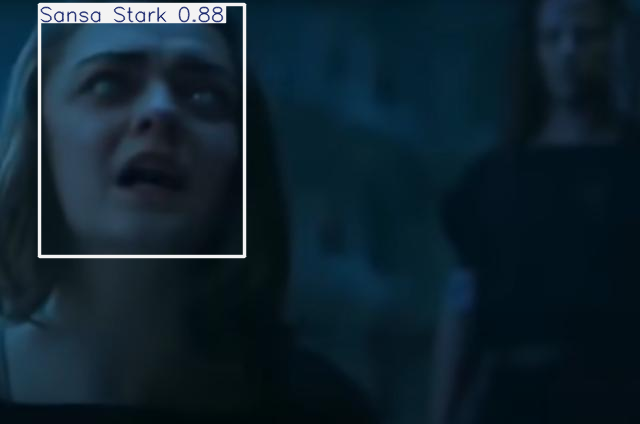


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/8.jpg: 544x640 (no detections), 433.3ms
Speed: 13.9ms preprocess, 433.3ms inference, 0.9ms postprocess per image at shape (1, 3, 544, 640)


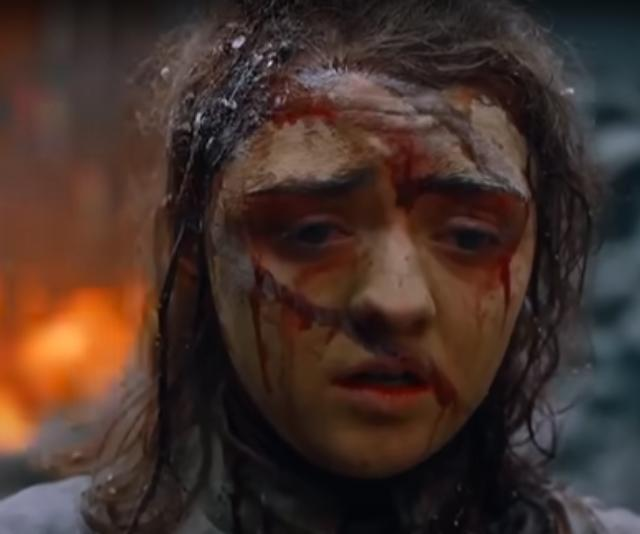


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/15.jpg: 448x640 (no detections), 390.1ms
Speed: 3.3ms preprocess, 390.1ms inference, 15.7ms postprocess per image at shape (1, 3, 448, 640)


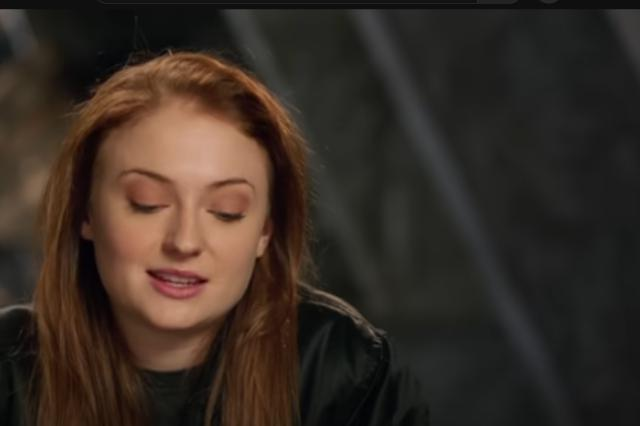


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/19.jpg: 448x640 1 Arya Stark, 316.1ms
Speed: 10.2ms preprocess, 316.1ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


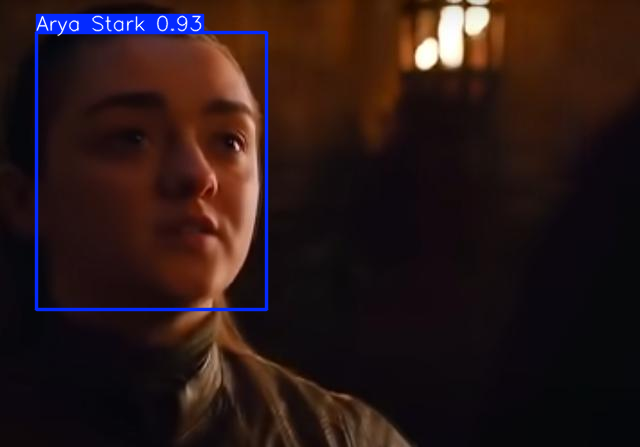


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/27.jpg: 512x640 (no detections), 247.7ms
Speed: 8.8ms preprocess, 247.7ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 640)


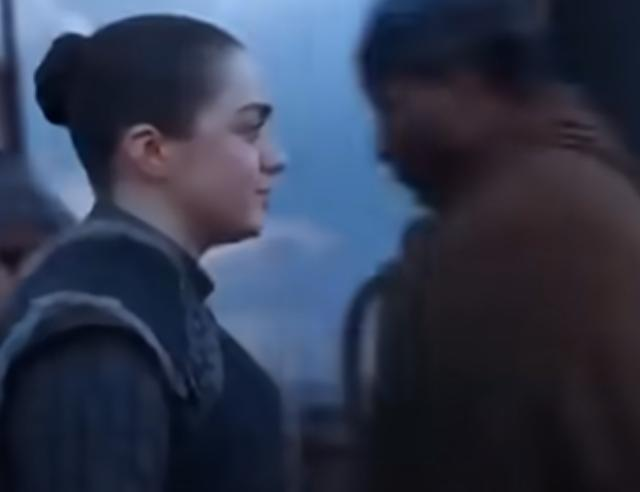


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/39.jpg: 320x640 (no detections), 160.4ms
Speed: 3.7ms preprocess, 160.4ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 640)


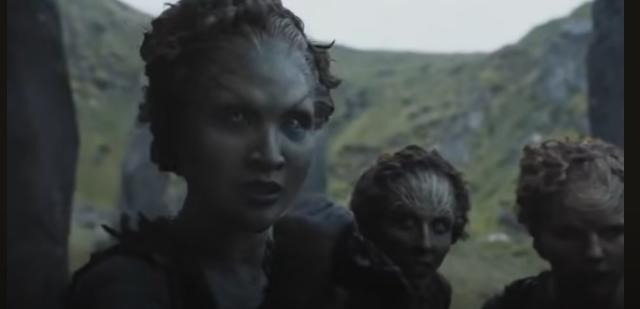


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/41.jpg: 384x640 1 Arya Stark, 172.6ms
Speed: 2.9ms preprocess, 172.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


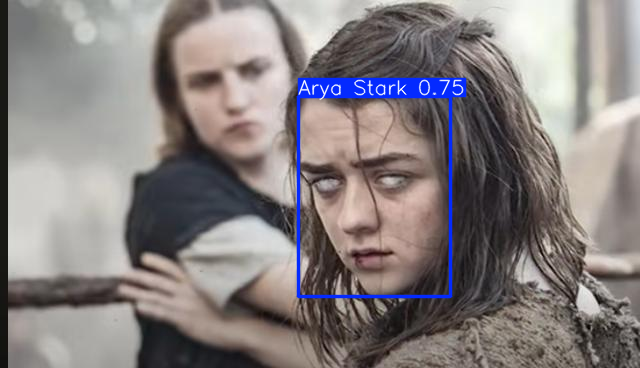


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/50.jpg: 352x640 5 otherss, 186.5ms
Speed: 3.6ms preprocess, 186.5ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)


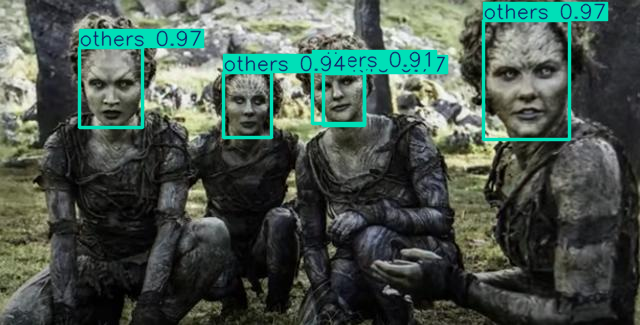


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/58.jpg: 384x640 1 others, 231.7ms
Speed: 3.8ms preprocess, 231.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


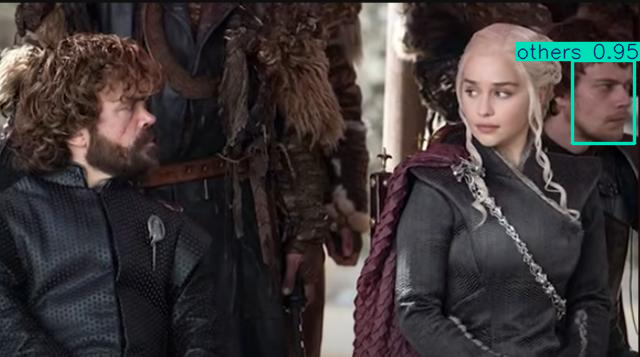


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/67.jpg: 384x640 1 others, 206.1ms
Speed: 8.0ms preprocess, 206.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


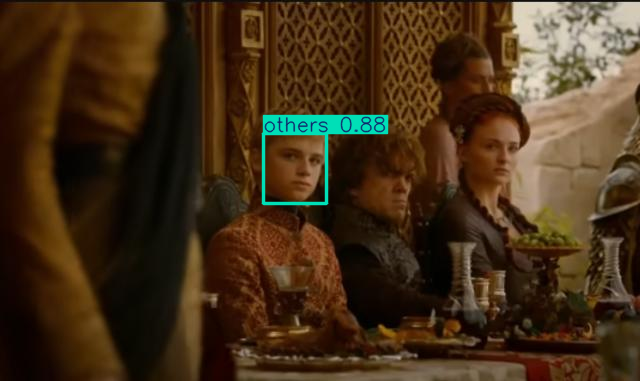


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/68.jpg: 352x640 1 Sansa Stark, 202.6ms
Speed: 3.6ms preprocess, 202.6ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)


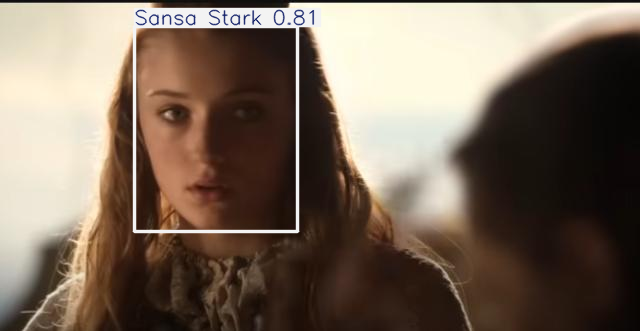


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/70.jpg: 480x640 (no detections), 264.6ms
Speed: 7.6ms preprocess, 264.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


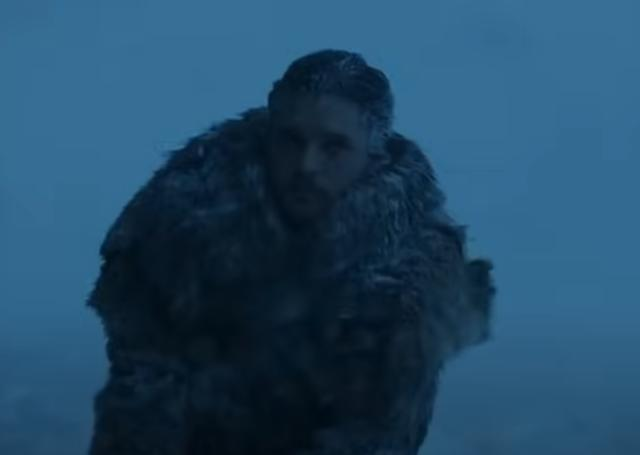


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/85.jpg: 448x640 2 otherss, 253.0ms
Speed: 7.4ms preprocess, 253.0ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


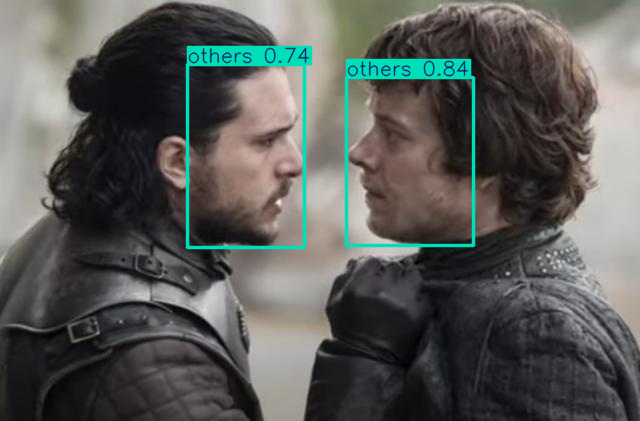


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/90.jpg: 352x640 (no detections), 206.9ms
Speed: 2.9ms preprocess, 206.9ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)


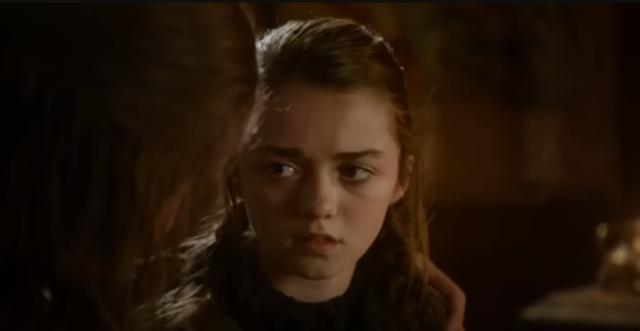


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/102.jpg: 352x640 1 John Snow, 204.9ms
Speed: 2.7ms preprocess, 204.9ms inference, 1.3ms postprocess per image at shape (1, 3, 352, 640)


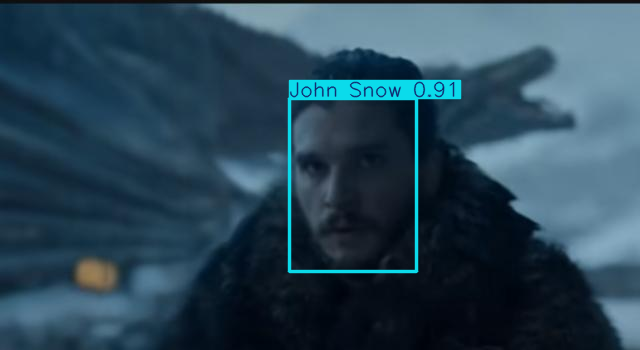


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/129.jpg: 480x640 (no detections), 300.8ms
Speed: 3.4ms preprocess, 300.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


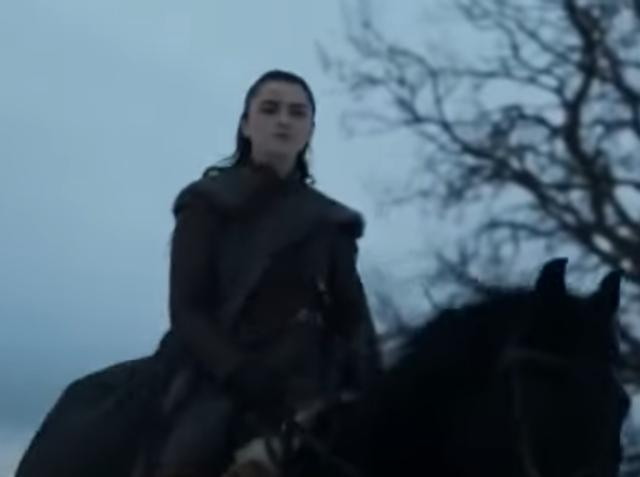


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/133.jpg: 384x640 2 otherss, 225.6ms
Speed: 3.0ms preprocess, 225.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


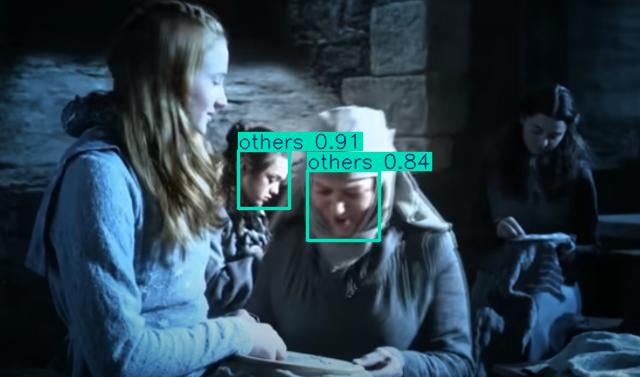


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/138.jpg: 384x640 1 Sansa Stark, 234.9ms
Speed: 6.9ms preprocess, 234.9ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


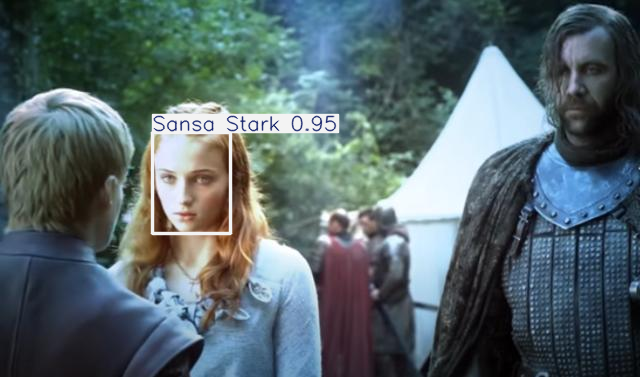


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/140.jpg: 384x640 1 Sansa Stark, 1 others, 237.6ms
Speed: 4.6ms preprocess, 237.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


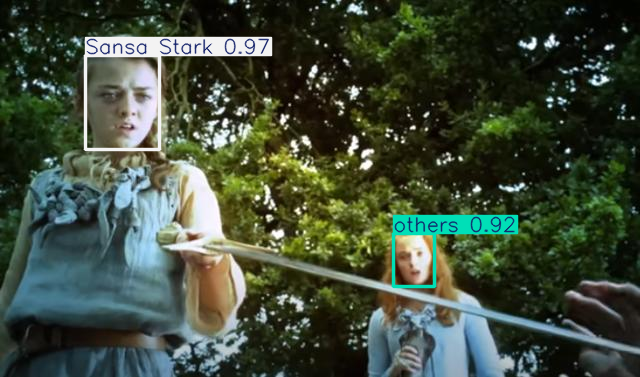


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/156.jpg: 512x640 1 John Snow, 325.3ms
Speed: 5.2ms preprocess, 325.3ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)


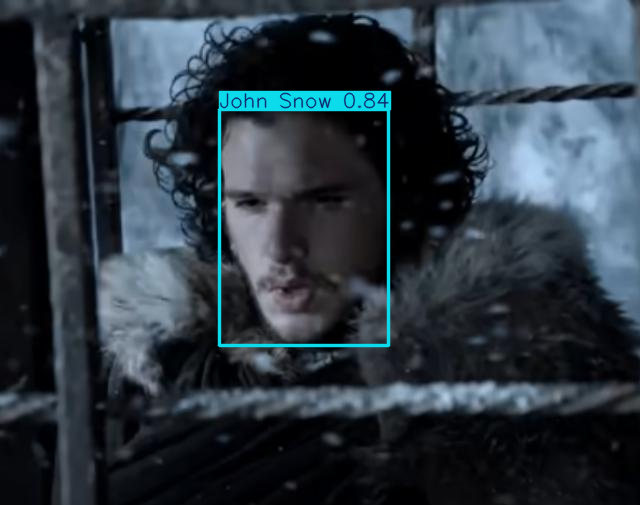


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/164.jpg: 352x640 1 Sansa Stark, 228.2ms
Speed: 3.2ms preprocess, 228.2ms inference, 1.3ms postprocess per image at shape (1, 3, 352, 640)


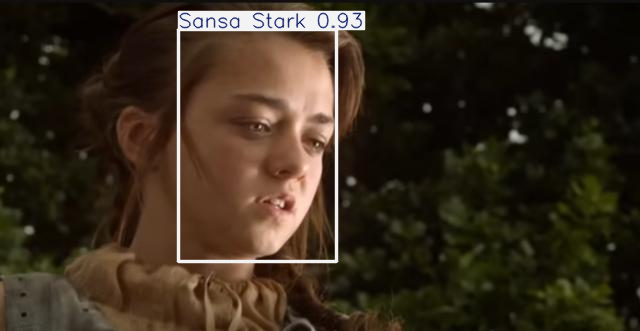


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/174.jpg: 384x640 3 Sansa Starks, 1 others, 236.1ms
Speed: 3.8ms preprocess, 236.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


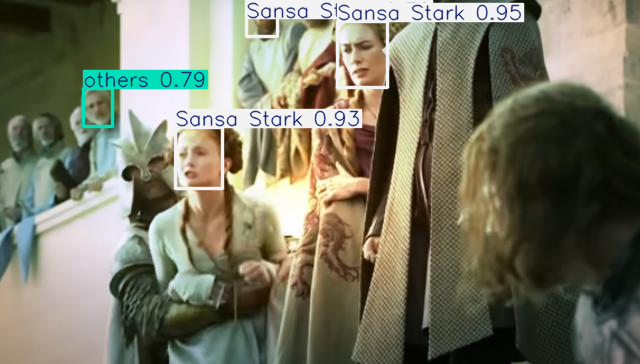


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/175.jpg: 384x640 1 Sansa Stark, 230.3ms
Speed: 3.0ms preprocess, 230.3ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


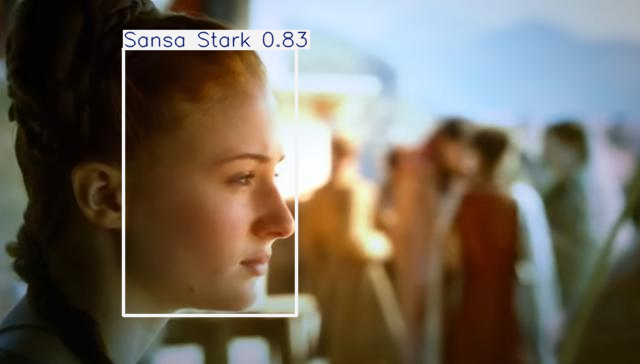


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/181.jpg: 384x640 1 Sansa Stark, 242.7ms
Speed: 4.0ms preprocess, 242.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


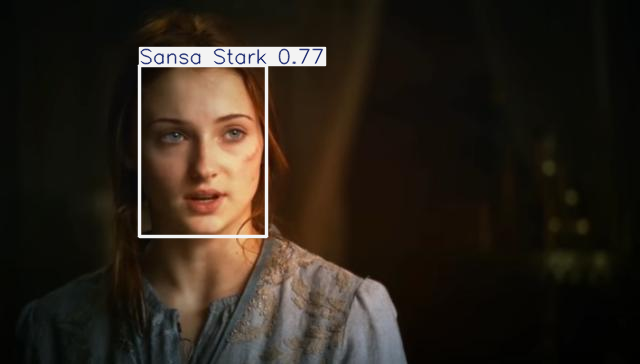


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/192.jpg: 384x640 1 John Snow, 1 Sansa Stark, 1 others, 240.7ms
Speed: 4.4ms preprocess, 240.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


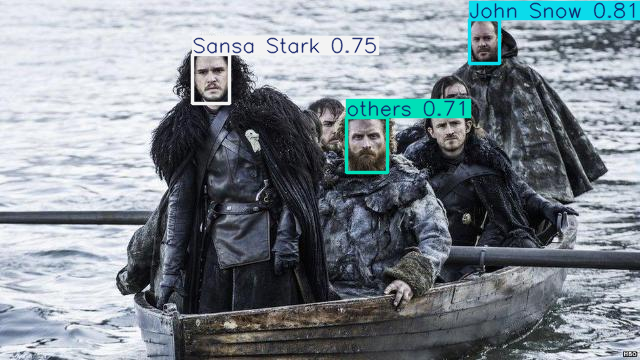


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/199.jpg: 576x640 1 John Snow, 406.9ms
Speed: 8.0ms preprocess, 406.9ms inference, 1.4ms postprocess per image at shape (1, 3, 576, 640)


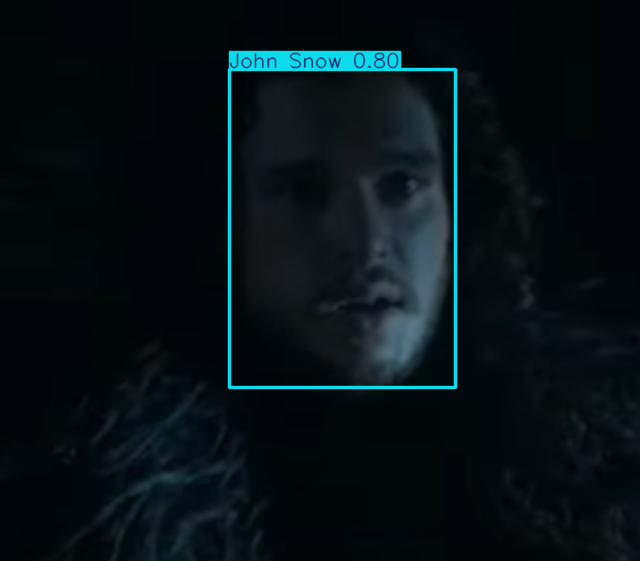


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/200.jpg: 384x640 1 Sansa Stark, 219.7ms
Speed: 3.3ms preprocess, 219.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


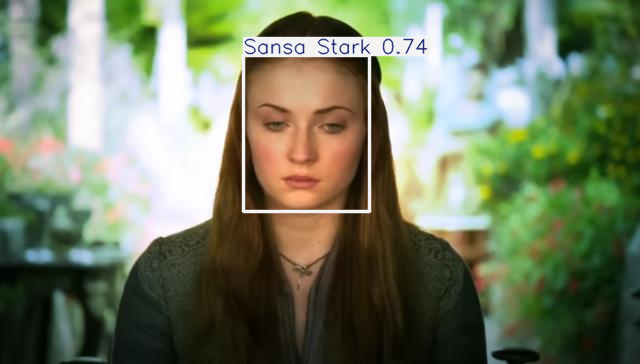


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/206.jpg: 384x640 1 Sansa Stark, 261.7ms
Speed: 3.7ms preprocess, 261.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


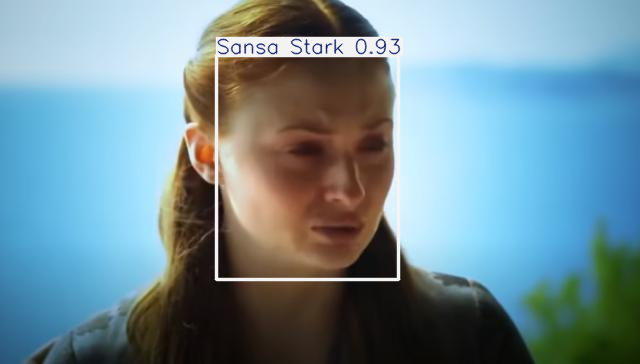


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/227.jpg: 448x640 1 Sansa Stark, 281.1ms
Speed: 3.8ms preprocess, 281.1ms inference, 4.8ms postprocess per image at shape (1, 3, 448, 640)


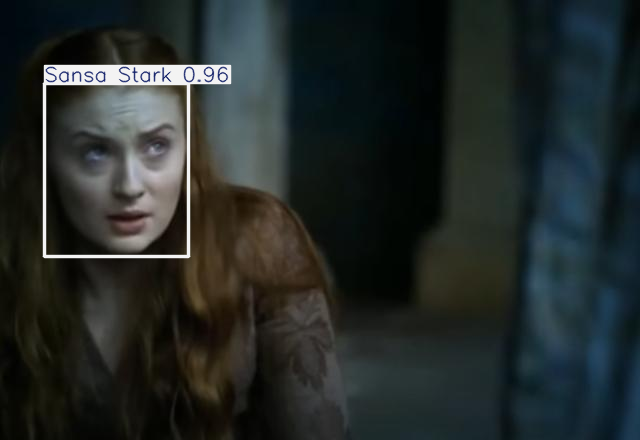


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/235.jpg: 384x640 1 Sansa Stark, 256.3ms
Speed: 3.6ms preprocess, 256.3ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)


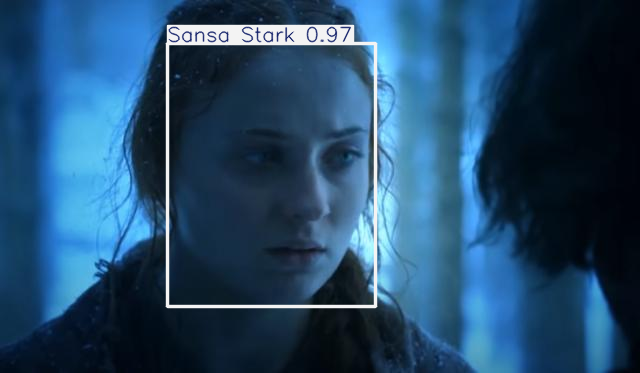


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/249.jpg: 384x640 1 Sansa Stark, 243.0ms
Speed: 3.6ms preprocess, 243.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


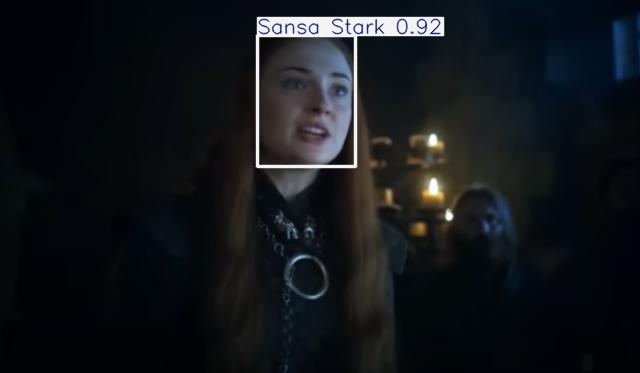


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/250.jpg: 384x640 1 Sansa Stark, 179.1ms
Speed: 3.1ms preprocess, 179.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


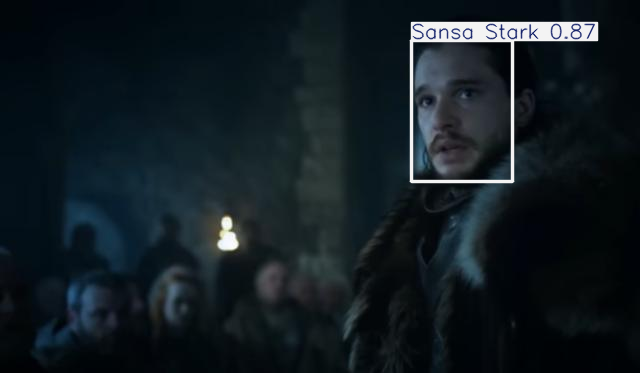


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/255.jpg: 352x640 1 Sansa Stark, 133.7ms
Speed: 2.2ms preprocess, 133.7ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)


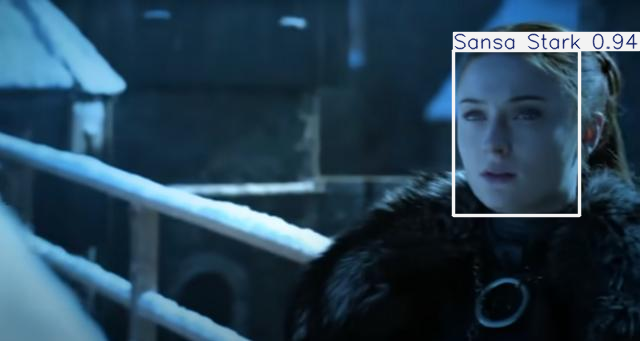


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/258.jpg: 448x640 2 John Snows, 163.5ms
Speed: 2.9ms preprocess, 163.5ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


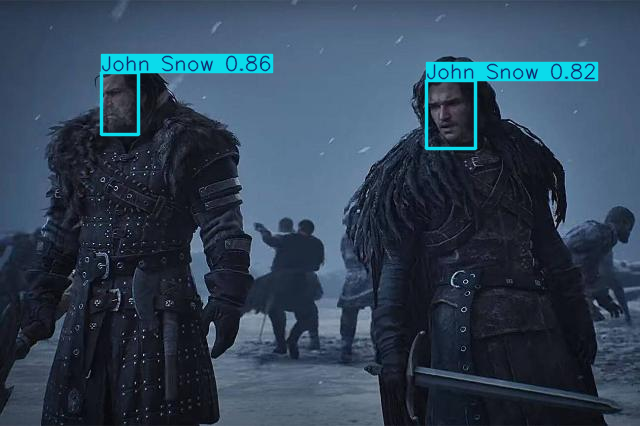


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/273.jpg: 352x640 (no detections), 129.0ms
Speed: 2.2ms preprocess, 129.0ms inference, 0.6ms postprocess per image at shape (1, 3, 352, 640)


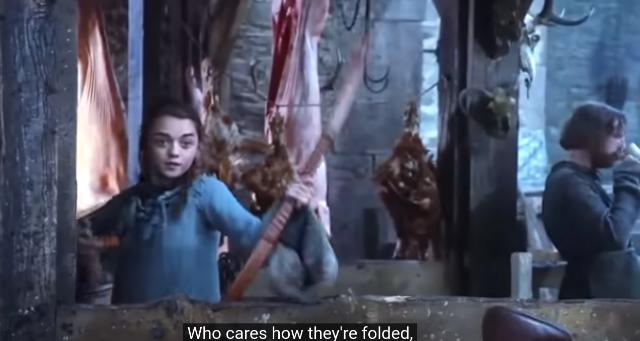


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/281.jpg: 384x640 1 others, 145.2ms
Speed: 2.3ms preprocess, 145.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


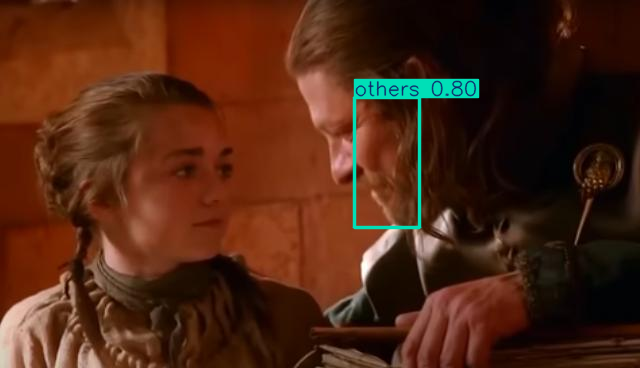


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/286.jpg: 640x640 (no detections), 255.9ms
Speed: 3.4ms preprocess, 255.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


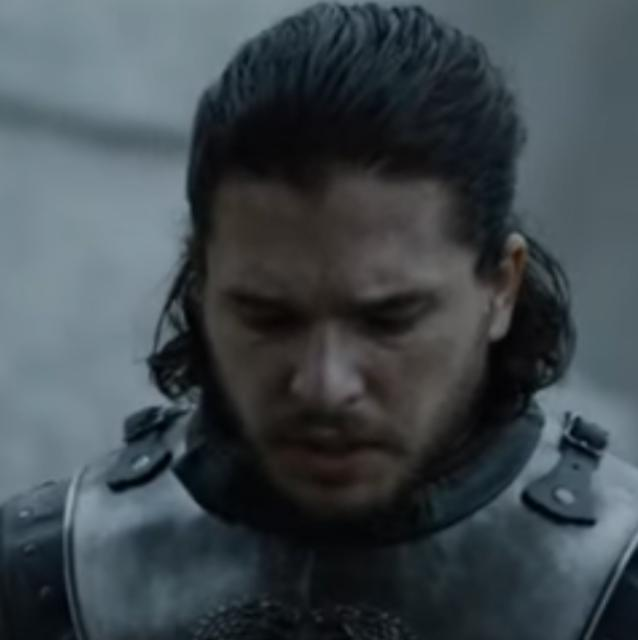


image 1/1 /content/drive/MyDrive/DIO Baires Dev/datasets/GoT/test/images/362.jpg: 384x640 1 John Snow, 142.3ms
Speed: 2.4ms preprocess, 142.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


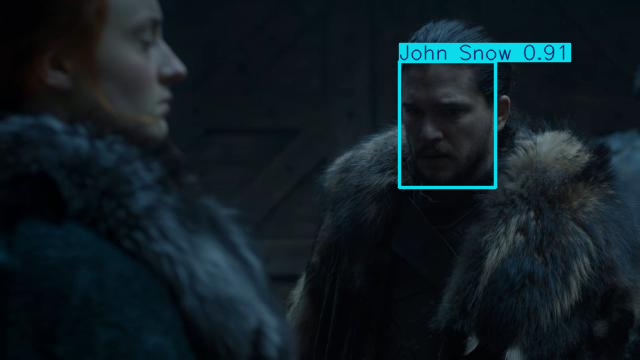

In [28]:
model = YOLO(os.path.join(dataset_path, 'runs/detect/train22/weights/best.pt'))
for it in [os.path.join(dataset_path, 'test/images', file) for file in os.listdir(os.path.join(dataset_path, 'test/images'))]:
  results = model.predict(source=it, conf=0.7, save=False)
  results[0].show()